<a href="https://colab.research.google.com/github/Untick/insects_detection/blob/Romashenkov-Leonid-branch/Romashenkov%20Leonid/LR_Segmentation_007.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Загрузка и распаковка данных

In [ ]:
!pip install -q gdown

In [ ]:
import gdown

file_id = '1UAwBjic5zl2bY-I3w7JSycVqf0PzG-tL'
output_file = 'seg1.tgz'
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)

Downloading...
From: https://drive.google.com/uc?id=1UAwBjic5zl2bY-I3w7JSycVqf0PzG-tL
To: /content/seg1.tgz
100%|██████████| 9.78M/9.78M [00:00<00:00, 29.9MB/s]


'seg1.tgz'

In [ ]:
!tar xzf 'seg1.tgz'
!ls -l '/content/semantic.v3.1'

total 40
-rw-r--r-- 1 1000 1000   62 Sep 15 12:41 classes.csv
drwxrwxr-x 2 1000 1000 4096 Sep 15 15:46 test
drwxrwxr-x 2 1000 1000 4096 Sep 15 20:03 testmask
-rw-rw-r-- 1 1000 1000  184 Sep 15 20:19 test.txt
drwxrwxr-x 2 1000 1000 4096 Sep 15 15:47 train
drwxrwxr-x 2 1000 1000 4096 Sep 15 20:06 trainmask
-rw-rw-r-- 1 1000 1000 1316 Sep 15 20:20 train.txt
drwxrwxr-x 2 1000 1000 4096 Sep 15 15:47 val
drwxrwxr-x 2 1000 1000 4096 Sep 15 20:07 valmask
-rw-rw-r-- 1 1000 1000  360 Sep 15 20:20 val.txt


# GPU (Сначала сменить среду на Т4)

In [ ]:
!nvidia-smi

Sun Sep 17 13:48:53 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Install Segmentation model

In [ ]:
!pip install -U -q segmentation-models
!pip install -q tensorflow==2.8.4
!pip install -q keras<2.9

import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 498.1/498.1 MB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 69.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 101.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.3/462.3 kB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 85.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 108.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 70.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-datasets 4.9.2 requires protobuf>=3.20, but you have protobuf 3.19.6 which is incompatible.
t

In [ ]:
# Смотрим какие у нас есть модели сеток
!ls -l '/usr/local/lib/python3.10/dist-packages/segmentation_models/models'

total 60
-rw-r--r-- 1 root root 2133 Sep 17 13:49 _common_blocks.py
-rw-r--r-- 1 root root 9008 Sep 17 13:49 fpn.py
-rw-r--r-- 1 root root    0 Sep 17 13:49 __init__.py
-rw-r--r-- 1 root root 9676 Sep 17 13:49 linknet.py
-rw-r--r-- 1 root root 8413 Sep 17 13:49 pspnet.py
drwxr-xr-x 2 root root 4096 Sep 17 13:49 __pycache__
-rw-r--r-- 1 root root 8328 Sep 17 13:49 unet.py
-rw-r--r-- 1 root root  367 Sep 17 13:49 _utils.py


In [ ]:
# А что там внутри?
#!cat '/usr/local/lib/python3.10/dist-packages/segmentation_models/models/unet.py'

In [ ]:
#!cat '/usr/local/lib/python3.10/dist-packages/segmentation_models/models/pspnet.py'

## Какие есть архитектуры:
['resnet18',
'resnet34',
'resnet50',
'resnet101',
'resnet152',
'seresnet18',
'seresnet34',
'seresnet50',
'seresnet101',
'seresnet152',
'seresnext50',
'seresnext101',
'senet154',
'resnext50',
'resnext101',
'vgg16',
'vgg19',
'densenet121',
'densenet169',
'densenet201',
'inceptionresnetv2',
'inceptionv3',
'mobilenet',
'mobilenetv2',
'efficientnetb0',
'efficientnetb1',
'efficientnetb2',
'efficientnetb3',
'efficientnetb4',
'efficientnetb5',
'efficientnetb6',
'efficientnetb7']

In [ ]:
from tensorflow import keras
import segmentation_models as sm

In [ ]:
model = sm.Unet()

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
model = sm.Unet('resnet34', encoder_weights='imagenet')

85532672/85521592 [==============================] - 1s 0us/step


In [ ]:
model = sm.Unet('efficientnetb3', encoder_weights=None)

In [ ]:
model = sm.PSPNet('resnet34')

In [ ]:
model = sm.Linknet('resnet50')

94601216/94592056 [==============================] - 2s 0us/step


In [ ]:
# multiclass segmentation with non overlapping class masks (your classes + background)
model = sm.Unet('efficientnetb7', classes=3, activation='softmax')

258449408/258434480 [==============================] - 4s 0us/step


In [ ]:
# binary segmentation (this parameters are default when you call Unet('resnet34')
model = sm.Unet('resnet34', classes=1, activation='sigmoid')

In [ ]:
!pip install -U albumentations>=0.3.0 --user

## Прописываем пути и импортируем необходимое

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2
import keras
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
DATA_DIR = '/content/semantic.v3.1'

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'trainmask')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'valmask')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'testmask')

# Классы

In [ ]:
import pandas as pd

df = pd.read_csv('/content/semantic.v3.1/classes.csv', index_col= False)
df

,Pixel Value,Class
0,0,background
1,1,bad
2,2,cool
3,3,man
4,4,mean


# Импорт и визуализация

In [ ]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

# helper function for data visualization
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x


# classes for data loading and preprocessing
class Dataset:
    """Dataset. Read images, apply augmentation and preprocessing transformations.

    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing
            (e.g. noralization, shape manipulation, etc.)

    """

    CLASSES = ['bad', 'cool', 'man', 'mean']

    def __init__(
            self,
            images_dir,
            masks_dir,
            classes=None,
            augmentation=None,
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]

        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)
        #mask = cv2.imread(self.masks_fps[i])


        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')

        # add background if mask is not binary
        if mask.shape[-1] != 1:
            background = 1 - mask.sum(axis=-1, keepdims=True)
            mask = np.concatenate((mask, background), axis=-1)

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.ids)


class Dataloder(keras.utils.all_utils.Sequence):
    """Load data from dataset and form batches

    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """

    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):

        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])

        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]

        return batch

    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

## 2 Klassa (bad, cool)

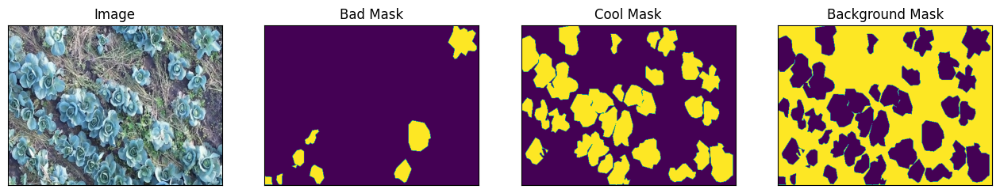

In [ ]:
# Lets look at data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=['bad', 'cool'])

image, mask = dataset[1] # get some sample
visualize(
    image=image,
    bad_mask=mask[..., 1].squeeze(),
    cool_mask=mask[..., 2].squeeze(),
    background_mask=mask[..., 0].squeeze(),
)

# Аугментация.

In [ ]:
import albumentations as A

In [ ]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# define heavy augmentations
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

        A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        A.RandomCrop(height=320, width=320, always_apply=True),

        A.IAAAdditiveGaussianNoise(p=0.2),
        A.IAAPerspective(p=0.5),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.IAASharpen(p=1),
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
        A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(384, 480)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:384: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/alb

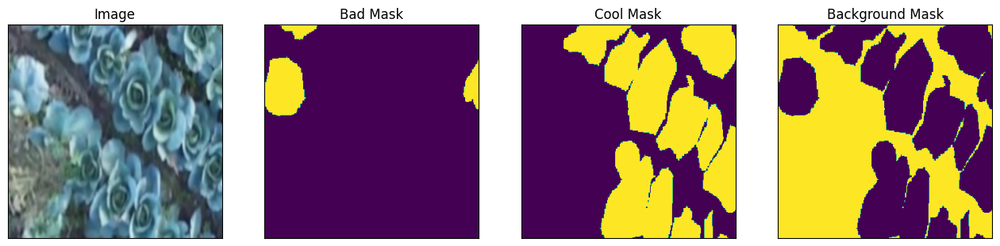

In [ ]:
# Lets look at augmented data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=['bad', 'cool'], augmentation=get_training_augmentation())

image, mask = dataset[5] # get some sample
visualize(
    image=image,
    bad_mask=mask[..., 1].squeeze(),
    cool_mask=mask[..., 2].squeeze(),
    background_mask=mask[..., 0].squeeze(),
)

# Строим модель U-Net на архитектуре EfficientNetB3
https://arxiv.org/pdf/1905.11946v5.pdf

In [ ]:
import segmentation_models as sm

In [ ]:
BACKBONE = 'efficientnetb3'
BATCH_SIZE = 8
CLASSES = ['bad', 'cool']
LR = 0.0001
EPOCHS = 40

preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
# define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

44122112/44107200 [==============================] - 1s 0us/step


In [ ]:
import tensorflow
from tensorflow.keras.optimizers import Adam

# define optomizer
#optim = keras.optimizers.Adam(LR)
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (background: 0.5; bad: 1; cool: 2)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.5, 1, 2]))
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)

In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    classes=CLASSES,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:384: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/alb

In [ ]:
# train model
history = model.fit_generator(
    train_dataloader,
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

<ipython-input-22-928b204bbf49>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/40
1/1 [==============================] - 37s 37s/step - loss: 0.7221 - iou_score: 0.1324 - f1-score: 0.2255 - val_loss: 0.7526 - val_iou_score: 0.1897 - val_f1-score: 0.2605 - lr: 1.0000e-04
Epoch 2/40
1/1 [==============================] - 1s 1s/step - loss: 0.7115 - iou_score: 0.1250 - f1-score: 0.2133 - val_loss: 0.7512 - val_iou_score: 0.1898 - val_f1-score: 0.2606 - lr: 1.0000e-04
Epoch 3/40
1/1 [==============================] - 1s 1s/step - loss: 0.6910 - iou_score: 0.1547 - f1-score: 0.2559 - val_loss: 0.7504 - val_iou_score: 0.1903 - val_f1-score: 0.2607 - lr: 1.0000e-04
Epoch 4/40
1/1 [==============================] - 1s 1s/step - loss: 0.6939 - iou_score: 0.1450 - f1-score: 0.2418 - val_loss: 0.7494 - val_iou_score: 0.1907 - val_f1-score: 0.2610 - lr: 1.0000e-04
Epoch 5/40
1/1 [==============================] - 1s 1s/step - loss: 0.6787 - iou_score: 0.1616 - f1-score: 0.2646 - val_loss: 0.7479 - val_iou_score: 0.1908 - val_f1-score: 0.2611 - lr: 1.0000e-04
Epoch 6/

# Графики обучения

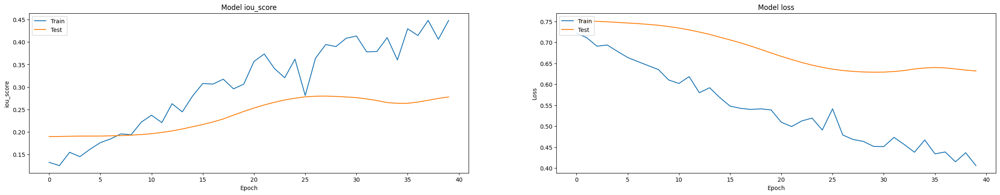

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Оценка модели

In [ ]:
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights('best_model.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-26-085d0e8f0f9f>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_dataloader)


Loss: 0.51215
mean iou_score: 0.3056
mean f1-score: 0.41764


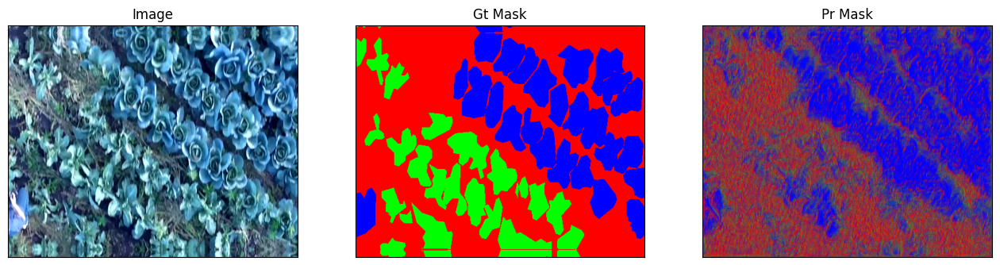

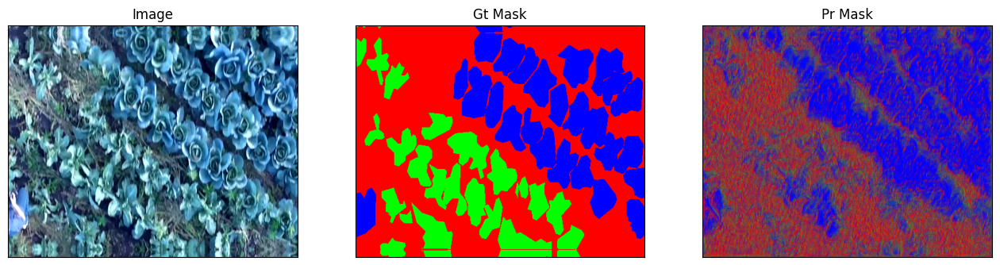

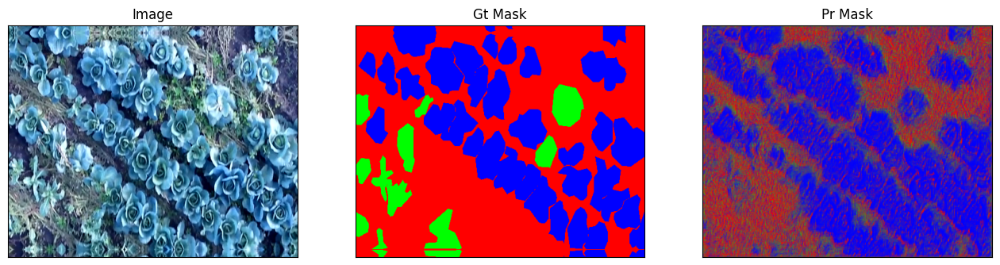

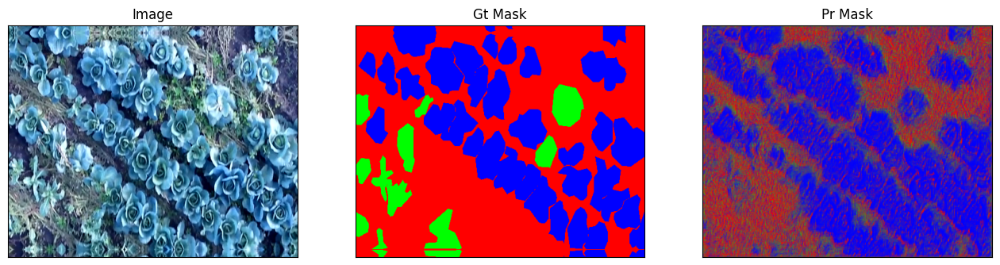

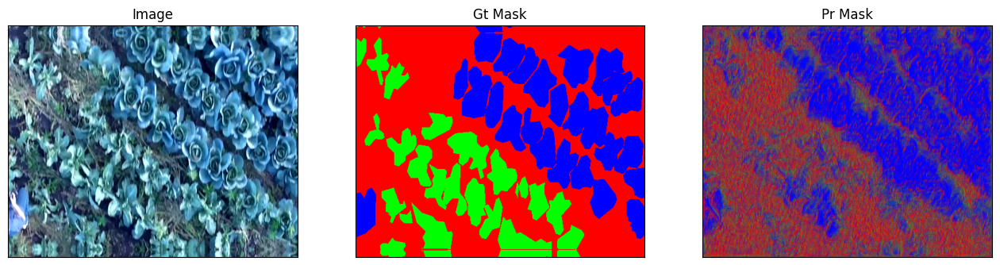

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image)

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

# Попробуем U-Net на архитектуре EfficientNetB7

In [ ]:
# Очистка памяти GPU.
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

In [ ]:
BACKBONE = 'efficientnetb7'
BATCH_SIZE = 8
CLASSES = ['bad', 'cool']
LR = 0.0001
EPOCHS = 40

preprocess_input = sm.get_preprocessing(BACKBONE)
#
# define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
#
import tensorflow
from tensorflow.keras.optimizers import Adam

# define optomizer
#optim = keras.optimizers.Adam(LR)
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (background: 0.5; bad: 1; cool: 2)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.5, 1, 2]))
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)
#
# Dataset for train images
train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    classes=CLASSES,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

258449408/258434480 [==============================] - 5s 0us/step


In [ ]:
# train model
history = model.fit_generator(
    train_dataloader,
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

<ipython-input-17-928b204bbf49>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/40
1/1 [==============================] - 60s 60s/step - loss: 0.7654 - iou_score: 0.1537 - f1-score: 0.2332 - val_loss: 0.8952 - val_iou_score: 0.1930 - val_f1-score: 0.2532 - lr: 1.0000e-04
Epoch 2/40
1/1 [==============================] - 3s 3s/step - loss: 0.7602 - iou_score: 0.1498 - f1-score: 0.2285 - val_loss: 0.8887 - val_iou_score: 0.1941 - val_f1-score: 0.2541 - lr: 1.0000e-04
Epoch 3/40
1/1 [==============================] - 4s 4s/step - loss: 0.7449 - iou_score: 0.1599 - f1-score: 0.2473 - val_loss: 0.8815 - val_iou_score: 0.1956 - val_f1-score: 0.2551 - lr: 1.0000e-04
Epoch 4/40
1/1 [==============================] - 4s 4s/step - loss: 0.7111 - iou_score: 0.2037 - f1-score: 0.2896 - val_loss: 0.8749 - val_iou_score: 0.1971 - val_f1-score: 0.2561 - lr: 1.0000e-04
Epoch 5/40
1/1 [==============================] - 3s 3s/step - loss: 0.6974 - iou_score: 0.2007 - f1-score: 0.2901 - val_loss: 0.8683 - val_iou_score: 0.1984 - val_f1-score: 0.2570 - lr: 1.0000e-04
Epoch 6/

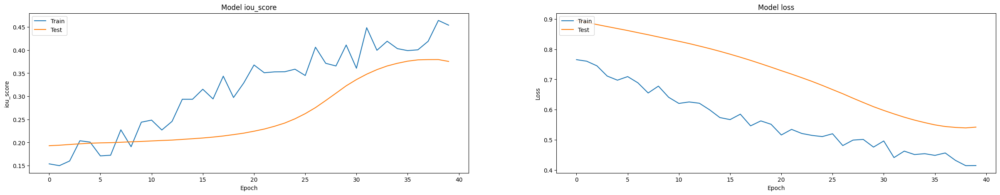

In [ ]:
# Графики
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# Оценка модели
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)
#
# load best weights
model.load_weights('best_model.h5')
#
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))


<ipython-input-19-122289402be5>:15: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_dataloader)


Loss: 0.41456
mean iou_score: 0.41307
mean f1-score: 0.53448


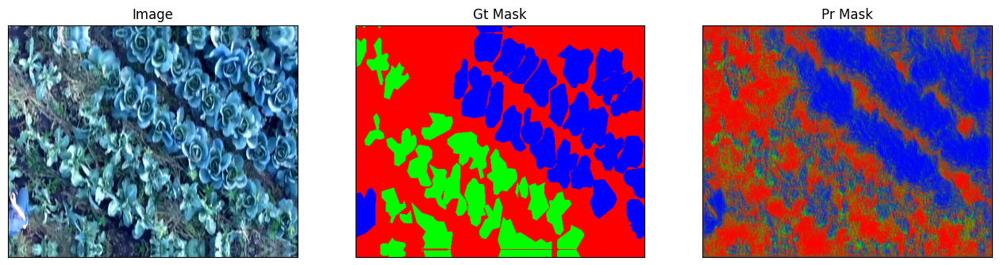

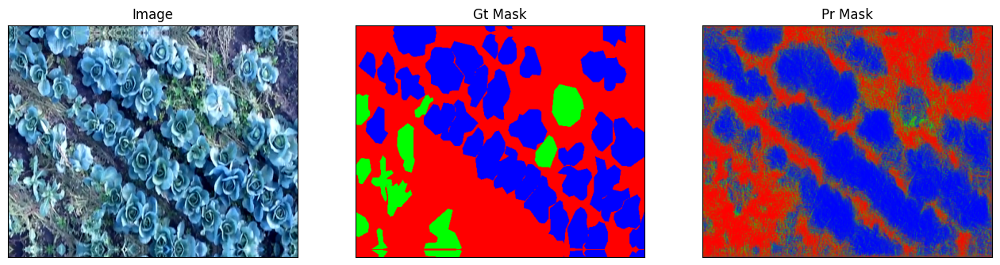

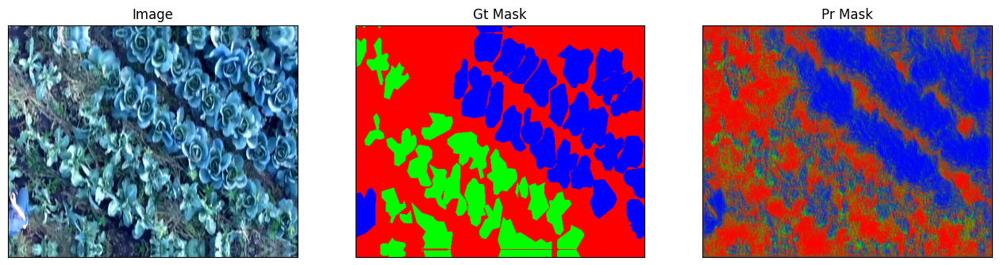

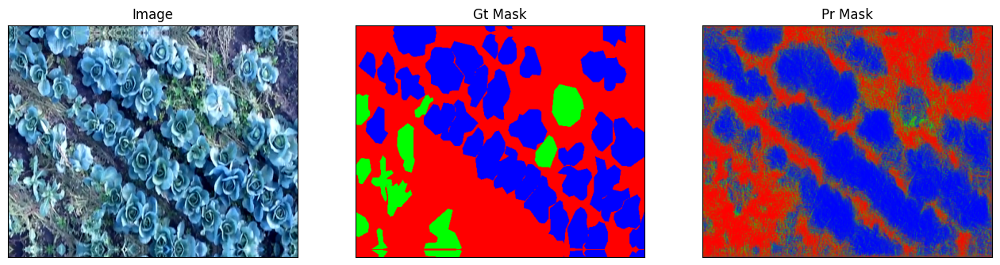

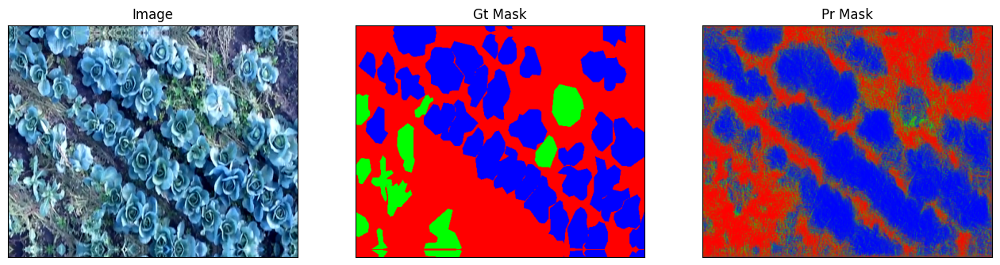

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image)

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

# Сменим веса: set class weights for dice_loss (background: 0.5; bad: 1; cool: 1)

In [ ]:
BACKBONE = 'efficientnetb3'
BATCH_SIZE = 8
CLASSES = ['bad', 'cool']
LR = 0.0001
EPOCHS = 40

preprocess_input = sm.get_preprocessing(BACKBONE)
#
# define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
#
import tensorflow
from tensorflow.keras.optimizers import Adam

# define optomizer
#optim = keras.optimizers.Adam(LR)
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (background: 0.5; bad: 1; cool: 1; mean: 0,5)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.5, 1, 1]))
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)
#
# Dataset for train images
train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    classes=CLASSES,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]
#
#
# train model
history = model.fit_generator(
    train_dataloader,
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

44122112/44107200 [==============================] - 1s 0us/step


<ipython-input-12-47946c883b26>:70: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/40
1/1 [==============================] - 35s 35s/step - loss: 0.8590 - iou_score: 0.1204 - f1-score: 0.2020 - val_loss: 1.0445 - val_iou_score: 0.0874 - val_f1-score: 0.1390 - lr: 1.0000e-04
Epoch 2/40
1/1 [==============================] - 2s 2s/step - loss: 0.8464 - iou_score: 0.1316 - f1-score: 0.2156 - val_loss: 1.0405 - val_iou_score: 0.0879 - val_f1-score: 0.1395 - lr: 1.0000e-04
Epoch 3/40
1/1 [==============================] - 1s 1s/step - loss: 0.8385 - iou_score: 0.1408 - f1-score: 0.2296 - val_loss: 1.0361 - val_iou_score: 0.0885 - val_f1-score: 0.1402 - lr: 1.0000e-04
Epoch 4/40
1/1 [==============================] - 1s 1s/step - loss: 0.8499 - iou_score: 0.1280 - f1-score: 0.2166 - val_loss: 1.0315 - val_iou_score: 0.0890 - val_f1-score: 0.1408 - lr: 1.0000e-04
Epoch 5/40
1/1 [==============================] - 1s 1s/step - loss: 0.8283 - iou_score: 0.1559 - f1-score: 0.2485 - val_loss: 1.0269 - val_iou_score: 0.0897 - val_f1-score: 0.1416 - lr: 1.0000e-04
Epoch 6/

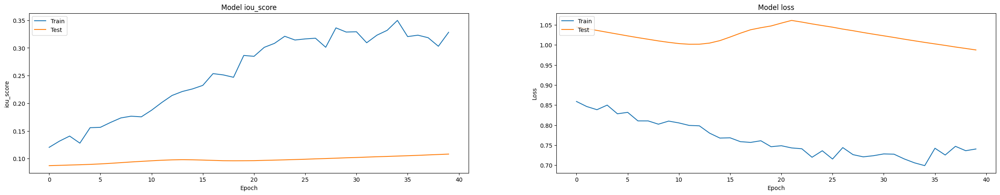

In [ ]:
# Графики
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# Оценка модели
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)
#
# load best weights
model.load_weights('best_model.h5')
#
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

Loss: 0.8742
mean iou_score: 0.15346
mean f1-score: 0.23935


<ipython-input-14-122289402be5>:15: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_dataloader)


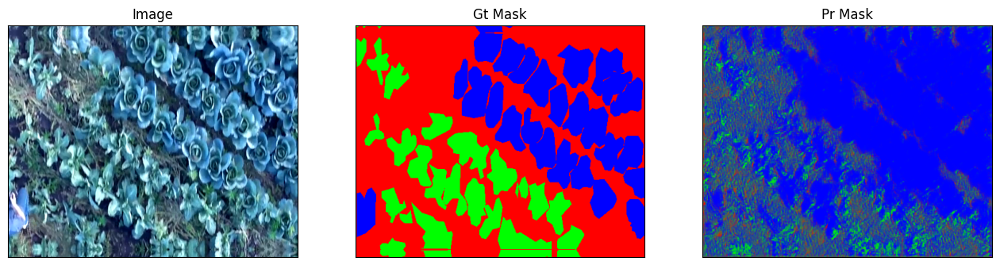

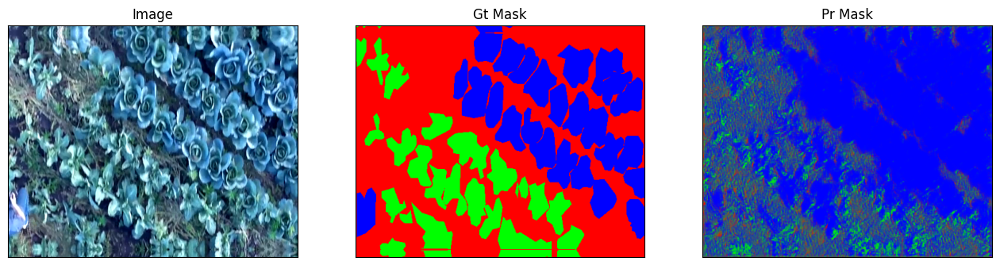

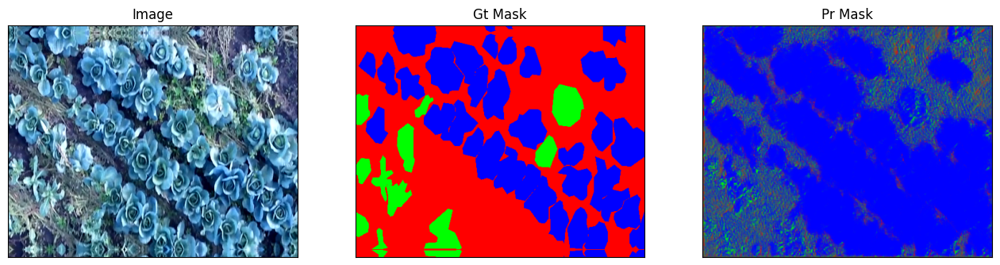

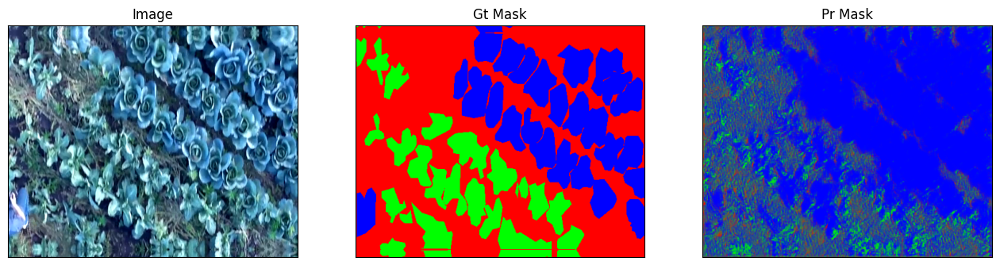

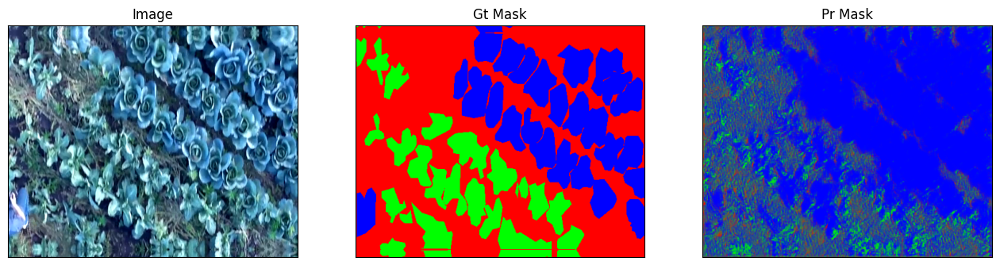

In [ ]:
# Рисунки
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image)

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

# 3 Klassa (bad, cool, mean)

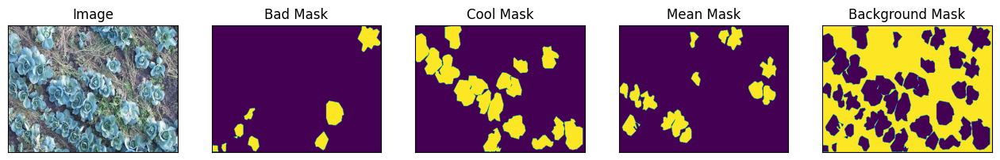

In [ ]:
dataset = Dataset(x_train_dir, y_train_dir, classes=['bad', 'cool', 'man', 'mean'])

image, mask = dataset[1] # get some sample
visualize(
    image=image,
    bad_mask=mask[..., 1].squeeze(),
    cool_mask=mask[..., 2].squeeze(),
#    man_mask=mask[..., 3].squeeze(),
	mean_mask=mask[..., 4].squeeze(),
    background_mask=mask[..., 0].squeeze(),
)

In [ ]:
BACKBONE = 'efficientnetb7'
BATCH_SIZE = 4
CLASSES = ['bad', 'cool', 'mean']
LR = 0.0001
EPOCHS = 40

preprocess_input = sm.get_preprocessing(BACKBONE)
#
# define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
#
import tensorflow
from tensorflow.keras.optimizers import Adam

# define optomizer
#optim = keras.optimizers.Adam(LR)
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (background: 0.5; bad: 1; cool: 1; mean: 1)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.5, 1, 1, 1]))
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)
#
# Dataset for train images
train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    classes=CLASSES,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]


/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:384: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/alb

In [ ]:
# train model
history = model.fit_generator(
    train_dataloader,
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/40


<ipython-input-166-928b204bbf49>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


3/3 [==============================] - 48s 6s/step - loss: 0.9143 - iou_score: 0.0341 - f1-score: 0.0651 - val_loss: 1.0728 - val_iou_score: 0.0368 - val_f1-score: 0.0679 - lr: 1.0000e-04
Epoch 2/40
3/3 [==============================] - 4s 2s/step - loss: 0.9013 - iou_score: 0.0383 - f1-score: 0.0725 - val_loss: 1.0508 - val_iou_score: 0.0423 - val_f1-score: 0.0771 - lr: 1.0000e-04
Epoch 3/40
3/3 [==============================] - 4s 2s/step - loss: 0.8851 - iou_score: 0.0529 - f1-score: 0.0978 - val_loss: 1.0388 - val_iou_score: 0.0469 - val_f1-score: 0.0846 - lr: 1.0000e-04
Epoch 4/40
3/3 [==============================] - 5s 2s/step - loss: 0.8770 - iou_score: 0.0634 - f1-score: 0.1151 - val_loss: 1.0315 - val_iou_score: 0.0499 - val_f1-score: 0.0893 - lr: 1.0000e-04
Epoch 5/40
3/3 [==============================] - 4s 2s/step - loss: 0.8681 - iou_score: 0.0704 - f1-score: 0.1263 - val_loss: 1.0270 - val_iou_score: 0.0519 - val_f1-score: 0.0924 - lr: 1.0000e-04
Epoch 6/40
3/3 [====

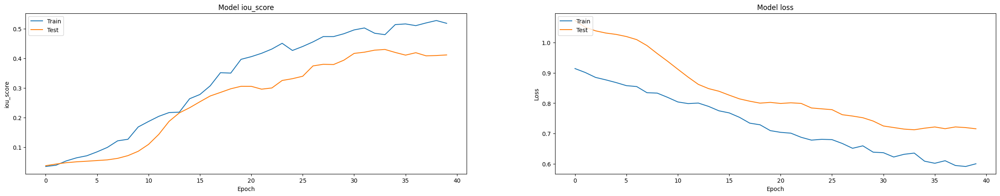

In [ ]:
# Графики
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# Оценка модели
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)
#
# load best weights
model.load_weights('best_model.h5')
#
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))


<ipython-input-168-122289402be5>:15: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_dataloader)


Loss: 0.61275
mean iou_score: 0.47297
mean f1-score: 0.57939


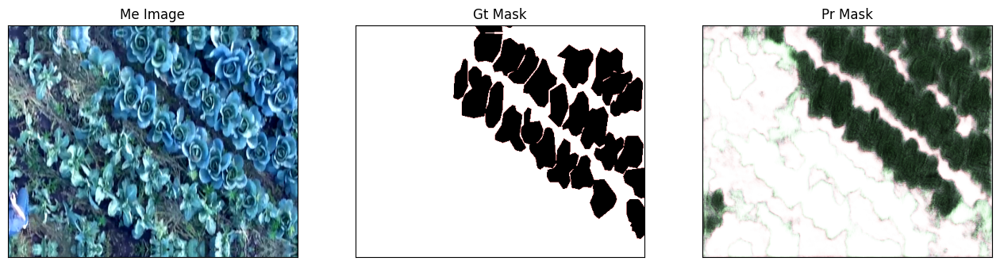

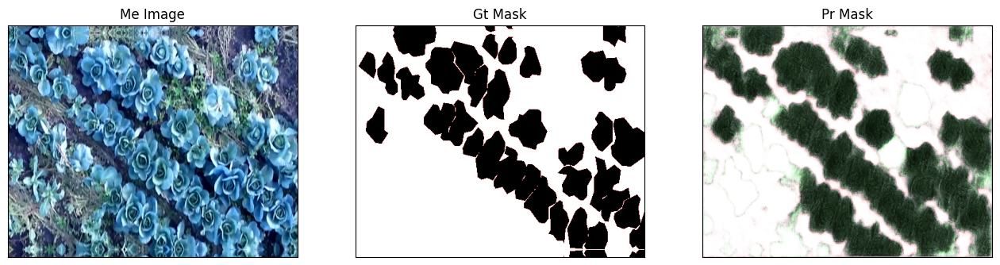

In [ ]:
# Рисунки
n = 2
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    me_image, gt_mask = test_dataset[i]
    me_image = np.expand_dims(me_image, axis=0)
    pr_mask = model.predict(me_image)

    visualize(
        me_image=denormalize(me_image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

# Выводы: Пока всё плохо. На 20 картинках ничему не научишь.